## Kurulumlar

* [Roboflow Tutorial](https://colab.research.google.com/drive/1-TNOcPm3Jr3fOJG8rnGT9gh60mHUsvaW#scrollTo=wXisIbT1Zqou)'ı örnek alınarak hazırlanmıştır.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


### Modelin kurulumu

In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8MB 26kB/s 
     |████████████████████████████████| 6.6MB 29.5MB/s 
ERROR: torchtext 0.9.1 has requirement torch==1.8.1, but you'll have torch 1.5.0+cu101 which is incompatible.
  Found existing installation: torch 1.8.1+cu101
    Uninstalling torch-1.8.1+cu101:
      Successfully uninstalled torch-1.8.1+cu101
  Found existing installation: torchvision 0.9.1+cu101
    Uninstalling torchvision-0.9.1+cu101:
      Successfully uninstalled torchvision-0.9.1+cu101
     |████████████████████████████████| 276kB 7.5MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44074 sha256=ca91321baa75e4e96cb4a7b943812405c8f20ee6580dea413e7f157fd321688d
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.1

In [ ]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2MB 1.4MB/s 
     |████████████████████████████████| 51kB 4.1MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20210402-cp37-none-any.whl size=59021 sha256=87ae9bce34a378797bd9a74d0b7198ba7784c3f59a2b58f3ce83dfb74f21dba5
  Stored in directory: /root/.cache/pip/wheels/a4/88/c2/12ecbba4159fe079e2bd2aa290571dba6e0b97efae3d7d3e7d
Successfully built fvcore


In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

### Verisetinin Yüklenmesi

In [ ]:
!curl -L "https://app.roboflow.com/ds/sBNWNFucdO?key=0XMVVoauEO" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   887  100   887    0     0   1249      0 --:--:-- --:--:-- --:--:--  1249
100 10.6M  100 10.6M    0     0  8638k      0  0:00:01  0:00:01 --:--:-- 30.8M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/40_jpg.rf.0d05936c3aba3a9fcb380aeb3b947150.jpg  
 extracting: test/41_jpg.rf.208e197ca6959810f451bd41dd27e5d5.jpg  
 extracting: test/42_jpg.rf.6416fb8d26802487f06408333b0310e7.jpg  
 extracting: test/44_jpg.rf.7fac1114a712ce2a143e897896bde057.jpg  
 extracting: test/45_jpg.rf.1ff637bb32650d509a4b6013efabec01.jpg  
 extracting: test/47_jpg.rf.0ecaea2684bb94f86b0bfc3a67f4eb3e.jpg  
 extracting: test/53_jpg.rf.dfa0fc8fdcf66b47b6b01cd512948fc1.jpg  
 extracting: test/55_jpg.rf.90b45e3706c95fe2eb70c89655904c5b.jpg  
 extracting: test/61_jpg.rf.471c9f0fe5ef982b74e6250f1d0a210f.jpg  
 

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")

WARNING [04/03 18:25:10 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/03 18:25:10 d2.data.datasets.coco]: Loaded 75 images in COCO format from /content/train/_annotations.coco.json


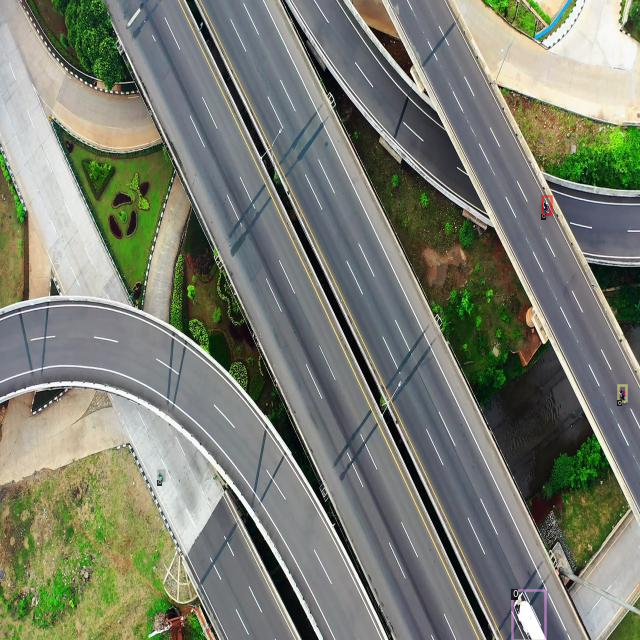

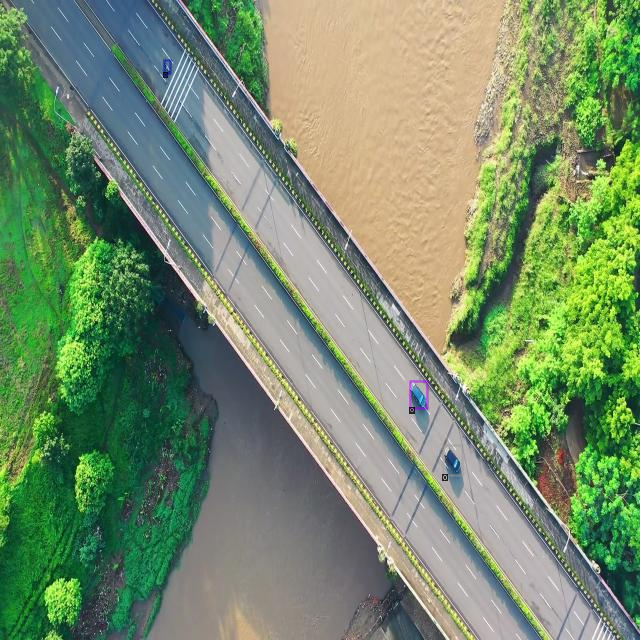

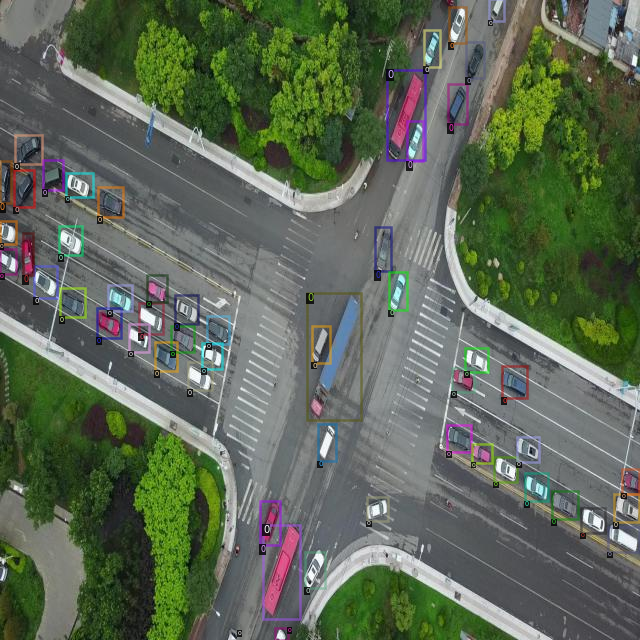

In [ ]:
# Verisetinin görselleştirilmesi
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=1)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## Modelin Eğitimi

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 2000 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[04/03 18:25:48 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:04, 91.1MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.


[04/03 18:25:54 d2.engine.train_loop]: Starting training from iteration 0
[04/03 18:26:31 d2.utils.events]:  eta: 1:01:56  iter: 19  total_loss: 3.697  loss_cls: 1.561  loss_box_reg: 0.536  loss_rpn_cls: 1.355  loss_rpn_loc: 0.332  time: 1.8445  data_time: 0.0257  lr: 0.000020  max_mem: 7239M
[04/03 18:27:11 d2.utils.events]:  eta: 1:02:33  iter: 39  total_loss: 2.406  loss_cls: 1.243  loss_box_reg: 0.664  loss_rpn_cls: 0.138  loss_rpn_loc: 0.258  time: 1.9261  data_time: 0.0087  lr: 0.000040  max_mem: 7239M
[04/03 18:27:56 d2.utils.events]:  eta: 1:05:00  iter: 59  total_loss: 1.943  loss_cls: 0.859  loss_box_reg: 0.697  loss_rpn_cls: 0.134  loss_rpn_loc: 0.257  time: 2.0352  data_time: 0.0117  lr: 0.000060  max_mem: 7239M
[04/03 18:28:39 d2.utils.events]:  eta: 1:06:42  iter: 79  total_loss: 1.736  loss_cls: 0.668  loss_box_reg: 0.698  loss_rpn_cls: 0.117  loss_rpn_loc: 0.219  time: 2.0696  data_time: 0.0116  lr: 0.000080  max_mem: 7239M
[04/03 18:29:22 d2.utils.events]:  eta: 1:06:0

### Eğitimin Görselleştirilmesi

## Test Verisinin İncelenmesi

In [ ]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [04/03 19:41:48 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/03 19:41:48 d2.data.datasets.coco]: Loaded 21 images in COCO format from /content/test/_annotations.coco.json
[04/03 19:41:48 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   | category   | #instances   | category   | #instances   |
|:----------:|:-------------|:-----------|:-------------|:-----------|:-------------|
| Arac-Insan | 0            | 0          | 106          | 1          | 0            |
|            |              |            |              |            |              |
|   total    | 106          |            |              |            |              |
[04/03 19:41:48 d2.data.common]: Serializing 21 elements to byte tensors and concatenating them all ...
[04/03 19:41:48 d2.data.common]: Serialized dataset takes 0.01 MiB
[04/03 19:41:48 d2.evaluation.evaluator]: Start inference on 21 i

OrderedDict([('bbox',
              {'AP': 53.05452327215556,
               'AP-0': 53.05452327215556,
               'AP-1': nan,
               'AP-Arac-Insan': nan,
               'AP50': 92.16549195862113,
               'AP75': 56.0163705639381,
               'APl': 80.0,
               'APm': 71.07260726072607,
               'APs': 49.80216415367412})])

## Kaydedilen Ağırlıklarla Test

In [ ]:
%ls ./output/

coco_instances_results.json                       last_checkpoint
events.out.tfevents.1617474349.9f53e7871215.60.0  metrics.json
instances_predictions.pth                         model_final.pth


In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

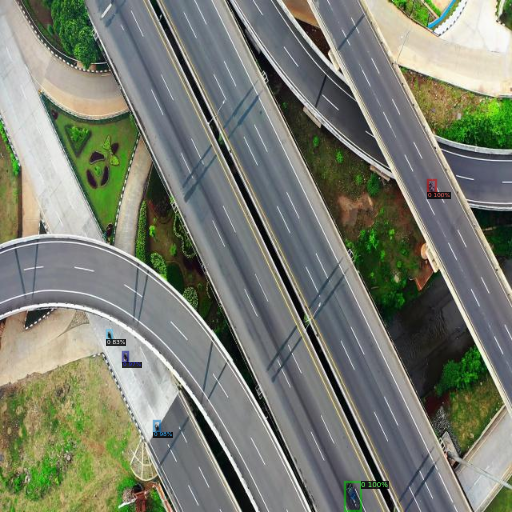

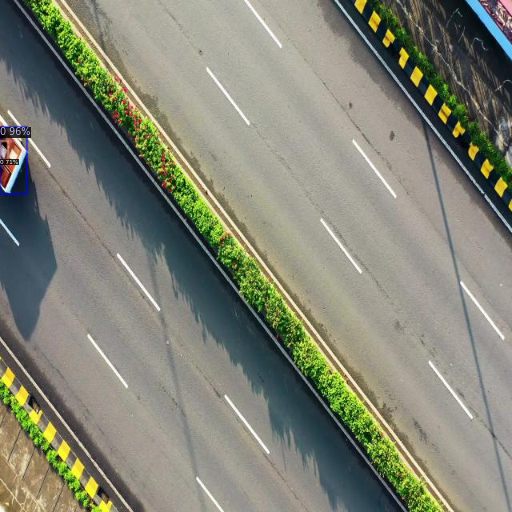

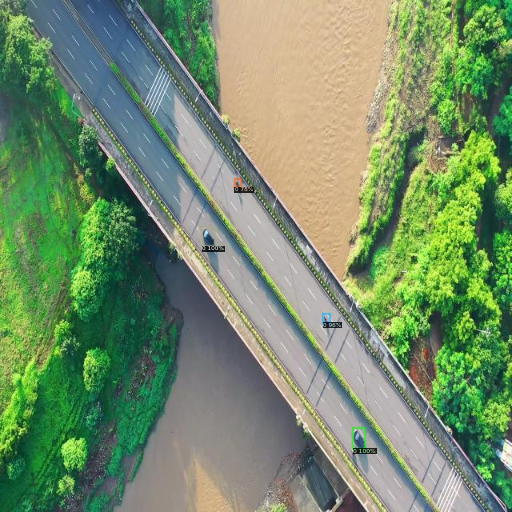

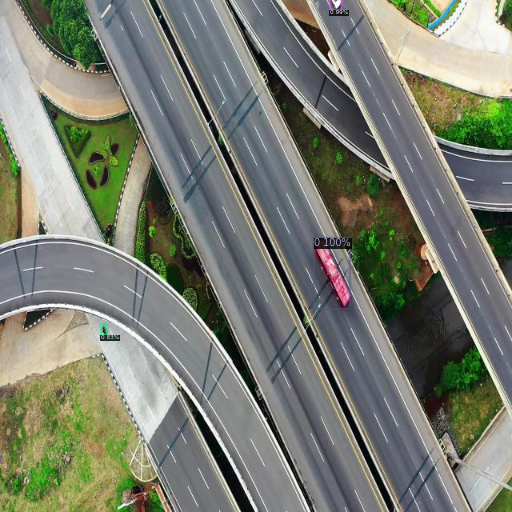

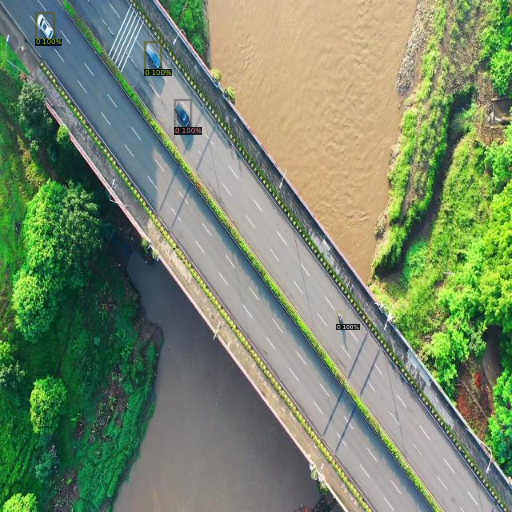

...

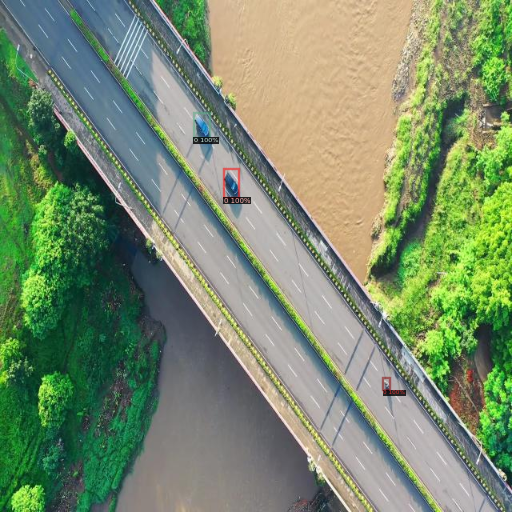

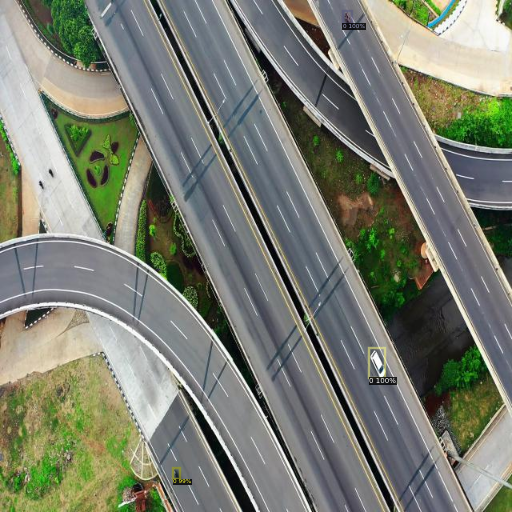

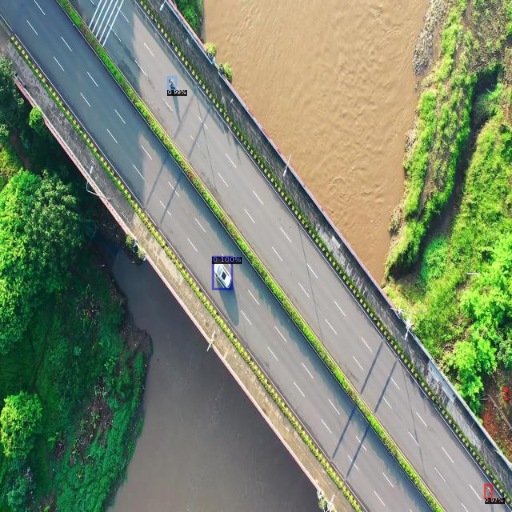

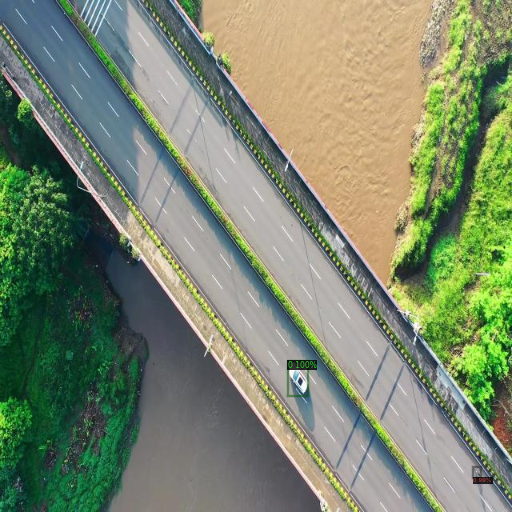

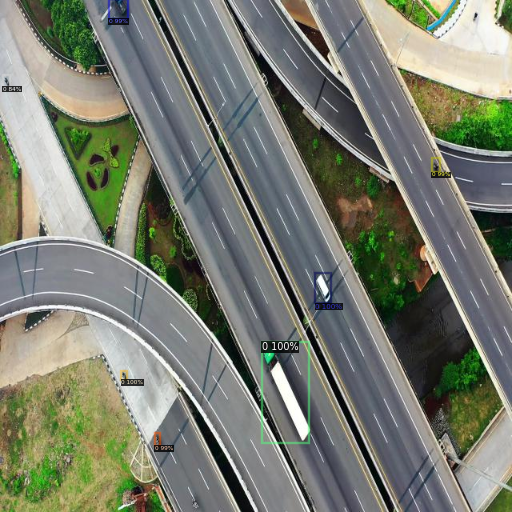

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])